In [1]:
from astropy.io import fits
import pandas as pd

In [2]:
from pathlib import Path

In [3]:
from importlib import reload
from utils import ks2_utils, shared_utils, image_utils

In [4]:
import re

# INPUT.KS2

In [5]:
ks2_filtermapper = ks2_utils.get_filter_mapper()

In [6]:
ks2_filemapper = ks2_utils.get_file_mapper()

# LOGR.XYVIQ1

LOGR.XYVIQ1 gives the average position for each source on the master frame (cols 1 and 2), the average flux (cols 5 and 11), the flux sigma (cols 6 and 12), and fit quality (cols 7 and 13) in each filter)


In [7]:
reload(ks2_utils)
master_catalog_df = ks2_utils.get_master_catalog()

In [8]:
master_catalog_df.head()

,umast0,vmast0,mmast1,NMAST,zmast1,szmast1,q1,o1,f1,g1,zmast2,szmast2,q2,o2,f2,g2
0,736.37,91.51,-2.3045,R0000001,8.352,2.586,0.900,0.01,9,9,14.088,1.538,0.963,0.01,9,9
1,737.04,34.36,-3.2771,R0000002,20.458,2.260,0.899,0.00,9,9,9.987,2.508,0.909,0.00,16,16
2,740.65,61.26,-5.9669,R0000003,243.655,3.332,0.999,0.01,9,9,177.850,2.386,0.999,0.02,9,9
3,745.91,93.19,-2.9646,R0000004,15.340,1.092,0.968,0.01,9,9,19.786,2.601,0.982,0.01,9,9
4,749.93,124.75,-4.4803,R0000005,61.959,3.305,0.997,0.00,9,9,84.200,2.850,0.998,0.00,18,18


# LOGR.FIND_NIMFO


In [9]:
reload(ks2_utils)
point_sources_df = ks2_utils.get_point_source_catalog(clean=False)

/Users/jaguilar/miniconda3/envs/astro37/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3254: DtypeWarning: Columns (20,28,34) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


In [10]:
point_sources_df.head(5)

,umast,vmast,magu,utile,vtile,z0,sz0,f0,g0,u1,...,o3,f3,g3,NMAST,ps_tile_id,tile_id,master_exp_id,filt_id,unk,chip_id
0,736.424,91.482,-2.0238,0.0,0.0,6.5,0.8,0,1,31.849,...,0.0,1,1,R0000001,L005,N001,G004,F1,C,1
1,736.459,91.452,-1.4531,0.0,0.0,3.7,0.8,0,1,31.918,...,0.0,1,1,R0000001,L005,N002,G006,F1,C,1
2,736.323,91.491,-2.5450,0.0,0.0,10.4,0.8,0,1,31.646,...,0.0,1,1,R0000001,L005,N003,G007,F1,C,1
3,736.306,91.445,-2.2584,0.0,0.0,8.3,0.8,0,1,31.611,...,0.0,1,1,R0000001,L005,N004,G009,F1,C,1
4,736.398,91.671,-2.5036,0.0,0.0,9.6,0.8,0,1,31.797,...,0.0,1,1,R0000001,L005,N005,G010,F1,C,1


# Diagnostic plots

In [11]:
figpath = Path("./figs/ks2/")

In [12]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import seaborn as sns

In [13]:
reload(image_utils)

<module 'utils.image_utils' from '/user/jaguilar/tr14/code/utils/image_utils.py'>

## Let's start with z vs q

In [14]:
filt_id = 'F2'
method_id = '1'
filt_name = ks2_utils.get_filter_name_from_ks2id(filt_id)

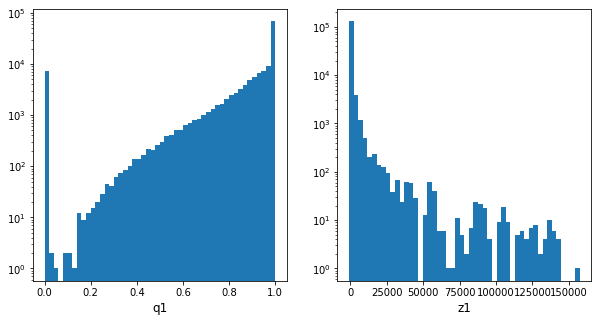

In [15]:
# First, just the distributions
nrows, ncols = 1, 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(5*ncols, 5*nrows))

tmp_df = point_sources_df.query(f'filt_id == "{filt_id}"')

ax = axes[0]
ax.set_xlabel(f"q{method_id}")
ax.hist(tmp_df[f'q{method_id}'], bins=50, log=True);

ax = axes[1]
ax.set_xlabel(f"z{method_id}")
ax.hist(tmp_df[f'z{method_id}'], bins=50, log=True);

## The new dataframe has no 0's

In [16]:
cut_df = point_sources_df.query(f'filt_id == "{filt_id}" and q{method_id} > 0 and z{method_id} > 0')

In [17]:
# now you can take logs of z and q without pesky infinities

In [18]:
# g = sns.JointGrid(x=cut_df[f'q{method_id}'],
#                   y=np.log10(tmp_df[f'z{method_id}']),
#                   space=0)
# g.plot_joint(plt.scatter, marker='o', s=10, alpha=0.1)
# g.plot_marginals(sns.distplot, kde=False)

In [19]:
def z2mag(z):
    """
    Take z and convert it to a shitty magnitude by applying -2.5*log10(z)
    """
    #return -2.5 * np.log10(z)
    return np.log10(z) * -2.5

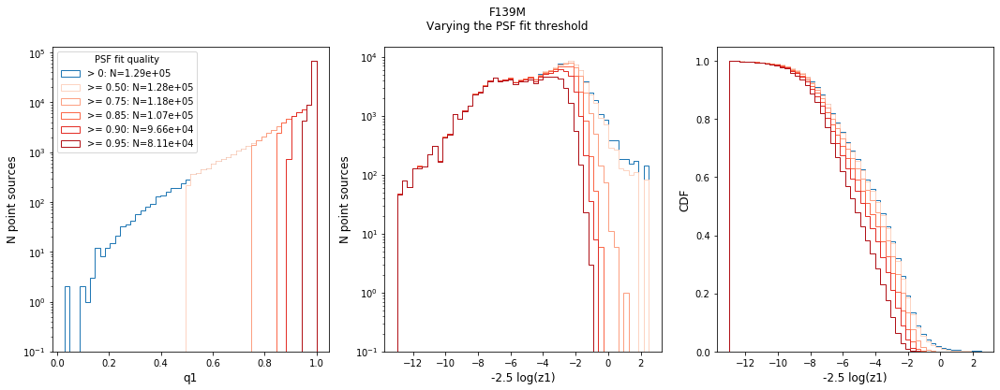

In [20]:
nrows, ncols = 1, 3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, 
                         figsize=(6*ncols, 6*nrows),
                         sharey=False)

# define what you're going to plot
axes[0].set_ylabel("N point sources")
axes[0].set_xlabel(f"q{method_id}")
axes[1].set_ylabel(f"N point sources")
axes[1].set_xlabel(f"-2.5 log(z{method_id})")
axes[2].set_ylabel(f"CDF")
axes[2].set_xlabel(f"-2.5 log(z{method_id})")


# plot all the data
label=f'> 0: N={len(cut_df):0.2e}'
hist_args = {'bins':50,
             'log':True, 
             'histtype':'step', 
             'cumulative':False,
             'ls':'-',
             'label':label,
             'density':False}

ax = axes[0]
q_hist = ax.hist(cut_df[f'q{method_id}'],
                 **hist_args);

ax = axes[1]
z_hist = ax.hist(z2mag(cut_df[f'z{method_id}']), 
                 **hist_args);

ax = axes[2]
# change arguments for CDF
cdf_args = hist_args.copy()
cdf_args['cumulative'] = -1
cdf_args['log'] = False
cdf_args['density'] = True
z_cdf = ax.hist(z2mag(cut_df[f'z{method_id}']),
                **cdf_args);

# now change the q threshold
q_thresholds = [0.5, 0.75, 0.85, 0.90, 0.95]
for i, thresh in enumerate(q_thresholds):
    tmp_df = cut_df.query(f"q{method_id} >= {thresh}")
    label = f'>= {thresh:0.2f}: N={len(tmp_df):0.2e}'
    hist_args['label'] = label
    cdf_args['label'] = label

    color = mpl.cm.Reds((i+1)/(len(q_thresholds)+1))
    ax = axes[0]
    hist_args['bins'] = q_hist[1]
    ax.hist(tmp_df[f'q{method_id}'], 
            color=color,
            **hist_args);

    ax = axes[1]
    hist_args['bins'] = z_hist[1]
    ax.hist(z2mag(tmp_df[f'z{method_id}']), 
            color=color,
            **hist_args);
    
    ax = axes[2]
    cdf_args['bins'] = z_cdf[1]
    cdf_args['log'] = False
    ax.hist(z2mag(tmp_df[f'z{method_id}']),
            color=color,
            **cdf_args);


axes[0].legend(loc='upper left', 
               title=f'PSF fit quality')

fig.suptitle(f"{filt_name}\nVarying the PSF fit threshold")
# fig.tight_layout()
if False:
    fig.savefig(figpath / f"q_z_distros-q_cuts-{filt_name}.png")

## Now do the same thing but cut on z

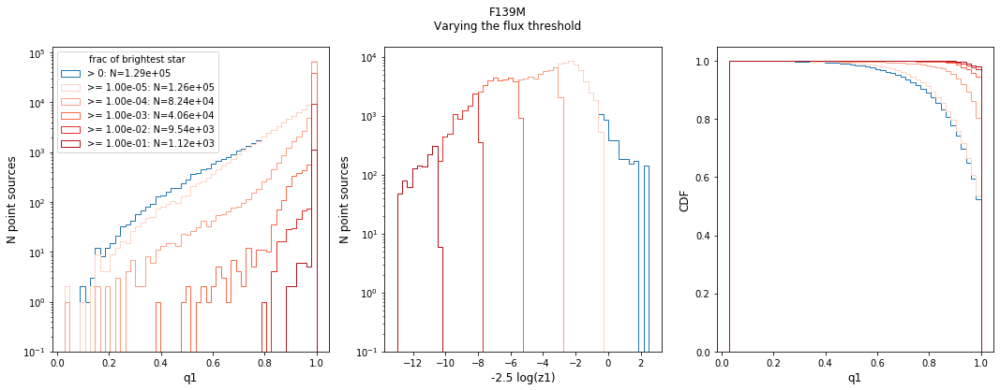

In [21]:
nrows, ncols = 1, 3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, 
                         figsize=(6*ncols, 6*nrows),
                         sharey=False)

# define what you're going to plot
axes[0].set_ylabel("N point sources")
axes[0].set_xlabel(f"q{method_id}")
axes[1].set_ylabel(f"N point sources")
axes[1].set_xlabel(f"-2.5 log(z{method_id})")
axes[2].set_ylabel(f"CDF")
axes[2].set_xlabel(f"q{method_id}")


# plot all the data
label=f'> 0: N={len(cut_df):0.2e}'
hist_args = {'bins':50,
             'log':True, 
             'histtype':'step', 
             'cumulative':False,
             'ls':'-',
             'label':label,
            'density':False}

ax = axes[0]
q_hist = ax.hist(cut_df[f'q{method_id}'],
                 **hist_args);

ax = axes[1]
z_hist = ax.hist(z2mag(cut_df[f'z{method_id}']), 
                 **hist_args);

ax = axes[2]
# change arguments for CDF
cdf_args = hist_args.copy()
cdf_args['cumulative'] = -1
cdf_args['log'] = False
cdf_args['density'] = True

q_cdf = ax.hist(cut_df[f'q{method_id}'],
                **cdf_args);

# now change the q threshold
z_thresholds = np.logspace(-5, -1, 5)
for i, thresh in enumerate(z_thresholds):
    tmp_df = cut_df.query(f"z{method_id} >= {thresh * cut_df[f'z{method_id}'].max()}")
    label = f'>= {thresh:0.2e}: N={len(tmp_df):0.2e}'
    hist_args['label'] = label
    cdf_args['label'] = label
    color = mpl.cm.Reds((i+1)/(len(z_thresholds)+1))#f'C{i+1}'
    ax = axes[0]
    hist_args['bins'] = q_hist[1]
    ax.hist(tmp_df[f'q{method_id}'], 
            color=color,
            **hist_args);

    ax = axes[1]
    hist_args['bins'] = z_hist[1]
    ax.hist(z2mag(tmp_df[f'z{method_id}']), 
            color=color,
            **hist_args);
    
    ax = axes[2]
    cdf_args['bins'] = q_cdf[1]
    cdf_args['log'] = False
    ax.hist(tmp_df[f'q{method_id}'],
            color=color,
            **cdf_args);


axes[0].legend(loc='upper left', 
               title=f'frac of brightest star')


fig.suptitle(f"{filt_name}\nVarying the flux threshold")
# fig.tight_layout()
if False:
    fig.savefig(figpath / f"q_z_distros-z_cuts-{filt_name}.png")

# Do a bigger cut and count the remaining sources
New cut: *all* q and *all* z must be > 0 for a particular stamp

In [22]:
reload(ks2_utils)

<module 'utils.ks2_utils' from '/user/jaguilar/tr14/code/utils/ks2_utils.py'>

In [23]:
# this currently cuts all q,z > 0
cut_df = ks2_utils.clean_point_source_catalog(point_sources_df)

In [24]:
cut_df.shape

(186817, 42)

In [25]:
cut_df['NMAST'].unique().size

6545

In [26]:
master_catalog_df['NMAST'].unique().size

6552

## What does an inconsistent stamp look like?

In [27]:
gb_star = point_sources_df.groupby("NMAST")

In [28]:
gcols = ['g0','g1','g2','g3']
star_ind = 8
gb_star.get_group(list(gb_star.groups.keys())[star_ind])[gcols].all()

g0    False
g1    False
g2    False
g3     True
dtype: bool

In [29]:
star = list(gb_star.groups.keys())[star_ind]
grp = gb_star.get_group(star)
len(grp)

27

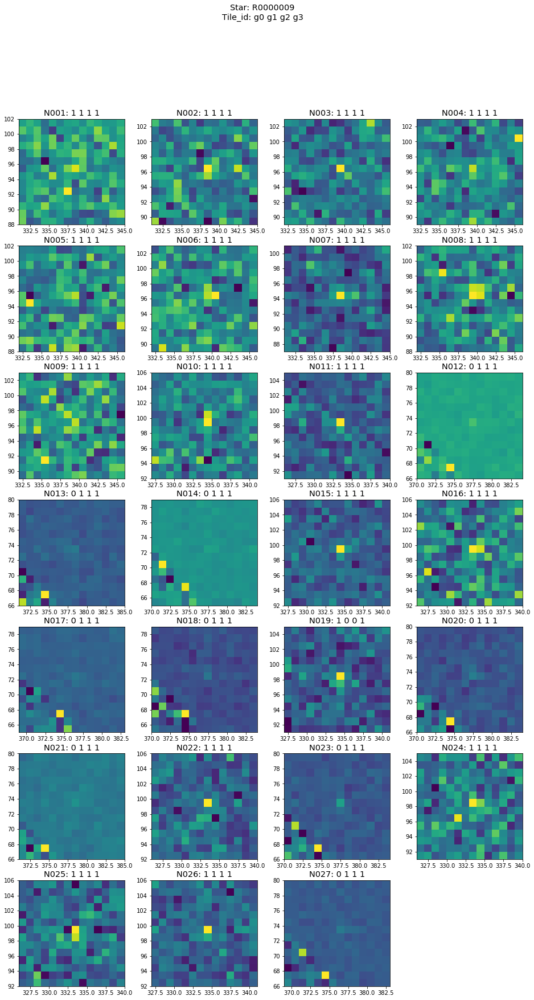

In [30]:
ncols = 4
nrows = np.int(np.ceil(len(grp)/4))
nrows
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4*ncols, 4*nrows),
                        sharex=False, sharey=False)
fig.suptitle(f"Star: {star}\nTile_id: g0 g1 g2 g3", size='x-large')
for ax, ind in zip(axes.ravel(), grp.index):
    row = grp.loc[ind]
    stamp, coord = image_utils.get_stamp_from_ks2(row, 15, return_img_ind=True)
    ax.pcolor(coord[1], coord[0], stamp)
    ax.set_aspect('equal')
    ax.set_title(f"{row['tile_id']}: {' '.join([str(int(i)) for i in row[gcols].values])}")
    
for ax in axes.ravel()[grp.index.size:]:
    ax.set_visible(False)

if False:
    fig.savefig(figpath / f"consistent_stamps-{star}.png")

In [31]:
reload(image_utils)
# this dict is indexed by the tile_id, which is unique for each stamp. and contains the stamp and the stamp coords
stamps = {row['tile_id']: image_utils.get_stamp_from_ks2(row, 15, return_img_ind=True)
          for i, row in grp.iterrows()}

In [32]:
# create a bokeh widget to scroll through the stamps
from ipywidgets import interact

import bokeh 
from bokeh.io import push_notebook, show, output_notebook
from bokeh import plotting as bplt
from bokeh.models import Slider

output_notebook()

img = stamps[grp.loc[grp.index[0], 'tile_id']][0]
ind = stamps[grp.loc[grp.index[0], 'tile_id']][1]

gcols = ['g1','g2','g3']
title=f"Stamp {grp.loc[grp.index[0], 'tile_id']} for {star}\t{' '.join([str(i) for i in grp.loc[grp.index[0], gcols].values])}"
fig = bplt.figure(title=title,
                  x_axis_label='x', y_axis_label='y',
                  tooltips=[("x", "$x"), ("y", "$y"), ("value", "@image")])

glyph = fig.image(image=[img], x=0, y=0, 
                  dw=len(ind[1]), dh=len(ind[0]),
                  palette=bokeh.palettes.Viridis256, 
                  level="image")


# TODO: connect this to a widget that lets you scroll through the stamps
stamp_names = list(stamps.keys()) # produce a fixed-order list of stamp names to index
# stamp_slider = Slider(title="stamp", value=0, start=0, end=len(stamps), step=1)
# def update_image(attrname, old, new):
#     # get the new stamp_index
#     a = stamp_slider.value
#     new_img, new_ind = stamps[stamp_names]
#     glyph.data_source.data['image'] = new_img    
#     push_notebook

# stamp_slider.on_change('value', update_image)
    
#bplt.show(stamp_slider)

Loading BokehJS ...

In [33]:
def update_images(stamp_num=0):
    # get the new stamp_index
    #new_img, new_ind = stamps[stamp_name]
    stamp_name = stamp_names[stamp_num]
    new_img, new_ind = stamps[stamp_name]
    print(new_ind)
#     glyph.data_source.stream({'image': new_img})
    glyph.data_source.data['image'] = new_img
    push_notebook() 

In [34]:
show(fig, notebook_handle=True)

In [35]:
interact(update_images, 
         #stamp_name=list(stamps.keys()), 
         stamp_num=(0, len(stamps)-1))

interactive(children=(IntSlider(value=0, description='stamp_num', max=26), Output()), _dom_classes=('widget-in…

<function __main__.update_images(stamp_num=0)>

The following lines work to produce an interactive Bokeh plot. Something about the image isn't updating.

In [36]:
# x = np.linspace(0, 2*np.pi, 2000)
# y = np.sin(x)

In [37]:
# p = bplt.figure(title='example', plot_height=300, plot_width=600, y_range=(-5,5))
# r = p.line(x, y, color="#2222aa", line_width=3)

In [38]:
# def update(f, w=1, A=1, phi=0):
#     if   f == 'sin': func = np.sin
#     elif f == 'cos': func = np.cos
#     elif f == 'tan': func = np.tan
#     r.data_source.data['y'] = A * func(w*x + phi)
#     push_notebook()

In [39]:
# bplt.show(p, notebook_handle=True)

In [40]:
# interact(update, f=['sin','cos','tan'], w=(0, 100), A=(1,5), phi=(0, 20, 0.1))

## Look at how the number of stamps per star has changed

In [41]:
gb = cut_df.groupby("NMAST")
len(gb.groups)

6545

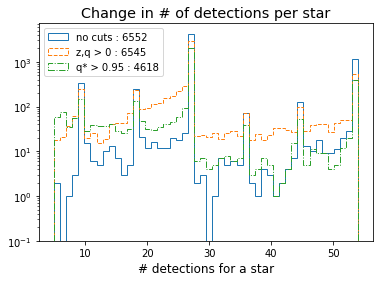

In [42]:
fig, ax = plt.subplots(1, 1)
ax.set_title("Change in # of detections per star")
ax.set_xlabel("# detections for a star")

hist_args = {'histtype':'step', 'log':True}

hist = ax.hist(point_sources_df.groupby("NMAST")['tile_id'].apply(len), 
               **hist_args, label=f"no cuts : {point_sources_df['NMAST'].unique().size}", 
               bins=50);
ax.hist(cut_df.groupby("NMAST")['tile_id'].apply(len),
       **hist_args, bins=hist[1], label=f'z,q > 0 : {len(cut_df.groupby("NMAST").groups)}',
        ls='--');
more_cuts = ' and '.join([f'q{method_id} > 0.95' for method_id in ks2_utils.phot_method_ids])
ax.hist(cut_df.query(more_cuts).groupby("NMAST")['tile_id'].apply(len),
       **hist_args, bins=hist[1], label=f'q* > 0.95 : {len(cut_df.query(more_cuts).groupby("NMAST").groups)}', 
        ls='-.');
ax.legend(loc='upper left')

## Now that you have cut data, plot the sources and the closest ones too

In [43]:
# plot all the point sources in an exposure, for both filtered and unfiltered data. Plot them side-by-side
exp_gb = point_sources_df.groupby("master_exp_id")

In [44]:
file_ind = 0
file_id = list(exp_gb.groups)[file_ind]
img = fits.getdata(shared_utils.get_data_file(ks2_utils.get_file_name_from_ks2id(file_id)), 1)

In [45]:
img[img<=0] = np.nan
img = np.log10(img)

### Show all 3 cuts:
1. No cut
1. q,z > 0
1. all q > 0.95

In [46]:
# first, select the chosen exposure
exp_df = point_sources_df.query(f"master_exp_id == '{file_id}'")
# q,z > 0
query_q_gt_0 = " and ".join([f'q{method_id} > 0' for method_id in ks2_utils.phot_method_ids])
query_z_gt_0 = " and ".join([f'z{method_id} > 0' for method_id in ks2_utils.phot_method_ids])
query_qz_gt_0 = query_q_gt_0 + ' and ' + query_z_gt_0
cut1_df = exp_df.query(query_qz_gt_0)

# q > some threshold
query_q_gt_thresh = " and ".join([f'q{method_id} > 0.95' for method_id in ks2_utils.phot_method_ids])
cut2_df = cut1_df.query(query_q_gt_thresh)

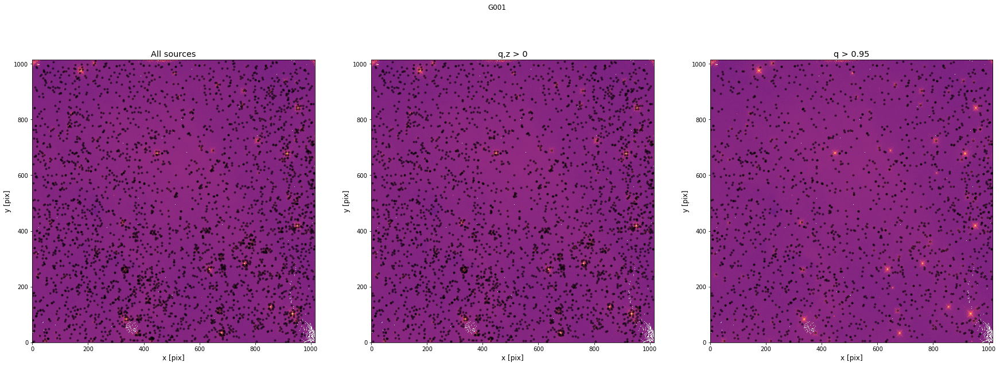

In [47]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 10))

fig.suptitle(f"{file_id}")

for ax in axes:
    ax.set_xlabel("x [pix]")
    ax.set_ylabel("y [pix]")

img_args = {#'norm':mpl.colors.LogNorm(),
            'cmap':mpl.cm.magma}
marker_color='k'

ax = axes[0]
ax.set_title("All sources")
ax.imshow(img, **img_args)
ax.scatter(exp_df['xraw1'],
           exp_df['yraw1'],
           marker='.', color=marker_color, alpha=0.5)

ax = axes[1]
ax.set_title("q,z > 0")
ax.imshow(img, **img_args)
ax.scatter(cut1_df['xraw1'],
           cut1_df.query(f"master_exp_id == '{file_id}'")['yraw1'],
           marker='.', color=marker_color, alpha=0.5)

ax = axes[2]
ax.set_title("q > 0.95")
ax.imshow(img, **img_args)
ax.scatter(cut2_df['xraw1'],
           cut2_df['yraw1'],
           marker='.', color=marker_color, alpha=0.5)

for ax in axes:
    ax.set_xlim(0, img.shape[1])
    ax.set_ylim(0, img.shape[0])

### Make a zoomable plot for q,z > 0

In [49]:
# bplt.output_file("image.html")
output_notebook()
title=f"{file_id}; q,z > 0"
fig = bplt.figure(title=title,
                  x_axis_label='x', y_axis_label='y',
                  #tooltips=[("x", "$x"), ("y", "$y"), ("value", "@image")]
                 )

glyph = fig.image(image=[img], x=0, y=0, 
                  dw=img.shape[1], 
                  dh=img.shape[0],
                  palette=bokeh.palettes.Magma256, 
                  level="image")
fig.scatter(x=cut1_df['xraw1'],
            y=cut1_df['yraw1'],
            size=2, alpha=1,
            marker='circle', fill_color=None, line_color='black')

# styling
fig.ygrid.visible=False
fig.xgrid.visible=False

show(fig)#, notebook_handle=True)

Loading BokehJS ...

In [50]:
cut1_df[(cut1_df[['xraw1','yraw1']].applymap(np.int) == (332, 261)).apply(np.all, axis=1)]

,umast,vmast,magu,utile,vtile,z0,sz0,f0,g0,u1,...,o3,f3,g3,NMAST,ps_tile_id,tile_id,master_exp_id,filt_id,unk,chip_id
128225,412.435,863.43,-11.916,0.0,0.0,58350.4,39.2,0,1,103.869,...,0.6,1,1,R0003862,L024,N001,G001,F1,C,1


### Make a zoomable plot for q(1,2,3) >= 0.95

In [52]:
# cut  to 1 >= 0.95
more_cuts = ' or '.join([f'q{method_id} > 0.75' for method_id in ks2_utils.phot_method_ids])
tmp_df = cut_df.query(more_cuts)

title=f"{file_id}"
fig = bplt.figure(title=title,
                  x_axis_label='x', y_axis_label='y',
                  #tooltips=[("x", "$x"), ("y", "$y"), ("value", "@image")]
                 )

glyph = fig.image(image=[img], x=0, y=0, 
                  dw=img.shape[1], 
                  dh=img.shape[0],
                  palette=bokeh.palettes.Magma256,
                  level="image")
fig.scatter(x=cut2_df['xraw1'],
            y=cut2_df['yraw1'],
            size=2, alpha=1,
            marker='circle', fill_color='black', line_color='black')
# styling
fig.ygrid.visible=False
fig.xgrid.visible=False

show(fig)#, notebook_handle=True)

## What's the deal with the brightest stars?

In [53]:
exp_df.sort_values(by='z1', ascending=False).head(20)[['z1','q1','q2','q3']].head(10)

,z1,q1,q2,q3
178725,116827.0,0.9999,0.9985,0.9993
203761,60988.9,0.9948,0.9949,0.9951
128225,58399.7,0.9984,0.9983,0.9990
152090,58097.5,0.9954,0.9994,1.0000
193161,52323.5,0.9997,0.9986,0.9987
60471,46727.8,0.9997,0.9997,0.9999
65746,44456.9,0.9993,0.9977,0.9980
174228,38441.2,0.9745,0.9423,0.9537
36791,33201.2,0.9978,0.9965,0.9979
119673,32555.9,0.9995,0.9998,0.9999


In [54]:
exp_df.sort_values(by='z1', ascending=False).head(20)[['z1','q1','q2','q3']].head(10)

,z1,q1,q2,q3
178725,116827.0,0.9999,0.9985,0.9993
203761,60988.9,0.9948,0.9949,0.9951
128225,58399.7,0.9984,0.9983,0.9990
152090,58097.5,0.9954,0.9994,1.0000
193161,52323.5,0.9997,0.9986,0.9987
60471,46727.8,0.9997,0.9997,0.9999
65746,44456.9,0.9993,0.9977,0.9980
174228,38441.2,0.9745,0.9423,0.9537
36791,33201.2,0.9978,0.9965,0.9979
119673,32555.9,0.9995,0.9998,0.9999


In [55]:
reload(ks2_utils)

<module 'utils.ks2_utils' from '/user/jaguilar/tr14/code/utils/ks2_utils.py'>

In [56]:
dist_mat = ks2_utils.generate_exposure_distance_matrix(exp_df)

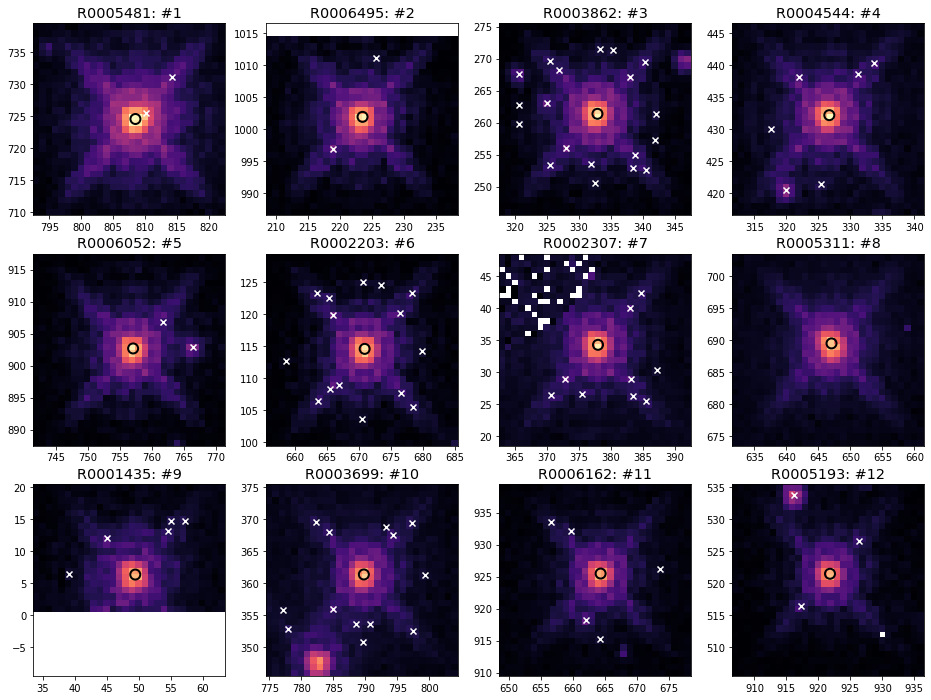

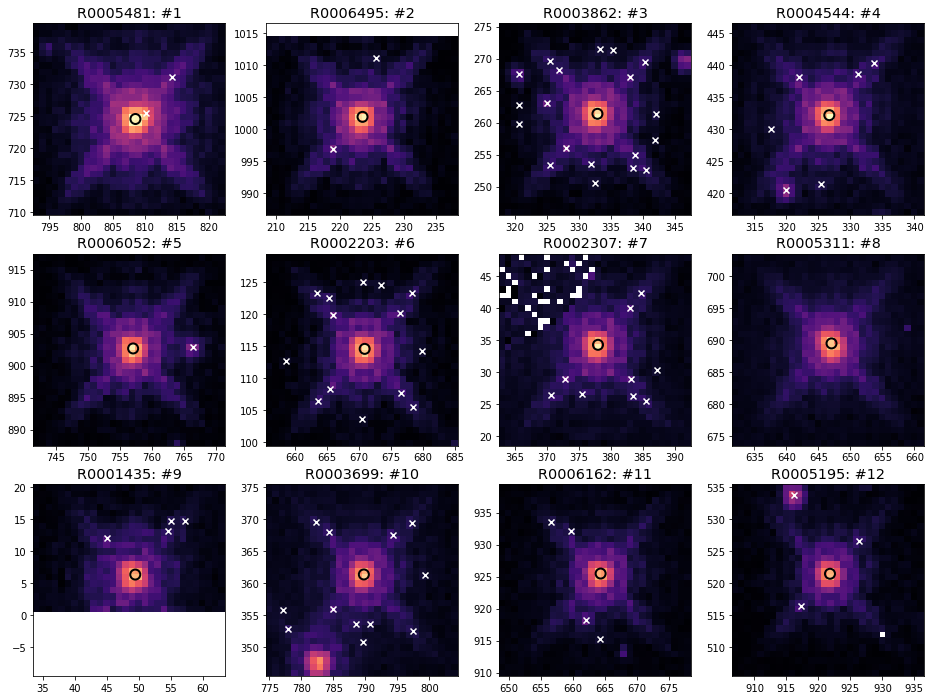

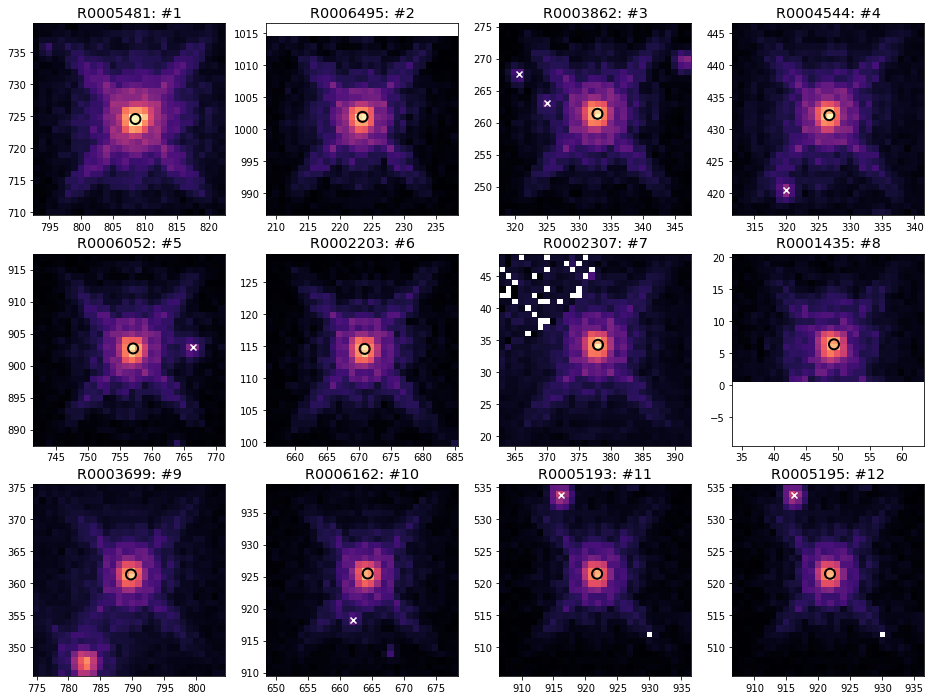

In [57]:
# plot the N brightest starts
Nimgs = 12
ncols = 4
nrows = np.int(np.ceil(Nimgs/ncols))

# fig.suptitle("Brightest stars and nearby sources, with no cuts")
stamp_size = 31
search_rad = 31//2

img_args = {'norm':mpl.colors.LogNorm(), 'cmap':mpl.cm.magma,}

for key, df in {'no_cuts':exp_df, 'qz_gt_0':cut1_df, 'q_gt_0.95':cut2_df}.items():
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4*ncols, 4*nrows))

    shift=0
    for i, row in df.sort_values(by='z1', ascending=False).reset_index().loc[shift:shift+Nimgs-1].iterrows():
        ax = axes.ravel()[i-shift]
        ax.set_title(f"{row['NMAST']}: #{i+1}")
        stamp, ind = image_utils.get_stamp_from_ks2(row, stamp_size, return_img_ind=True)
        ax.pcolor(ind[1]+0.5, ind[0]+0.5, stamp, **img_args)
        ax.scatter(row['xraw1'], row['yraw1'], marker='o', s=100, ec='k', lw=2, fc='none')
        # get neighbors
        neighbors = dist_mat[(dist_mat[row['NMAST']] < search_rad) & (dist_mat[row['NMAST']] > 0) ][row['NMAST']]
        for neighbor in neighbors.index:
            try:
                neighbor_pos = np.squeeze(df.query("NMAST == @neighbor")[['xraw1','yraw1']].values)
                ax.scatter(neighbor_pos[0], neighbor_pos[1], marker='x', color='w')
            except:
                # it's possible that the neighbor didn't make the cut. if so, then skip it
                pass

    for ax in axes.ravel():
        ax.set_aspect("equal")

    if False:
        fig.savefig(figpath / f"brightest_stamps-{key}.png", bbox_inches='tight')

In [ ]:
point_sources_df.query("z1<=0").head()

In [77]:
# plot the N brightest stars on the full-frame images
N = 100
# q > some threshold
thresh=0
query_q_gt_thresh = " and ".join([f'q{method_id} > {thresh}' for method_id in ks2_utils.phot_method_ids])
tmp_df = exp_df.query(query_q_gt_thresh).sort_values(by='z1', ascending=False).reset_index()

# bplt.output_file("image.html")
output_notebook()
title=f"{file_id} / {ks2_utils.get_file_name_from_ks2id(file_id)}"
fig = bplt.figure(title=title,
                  x_axis_label='x', y_axis_label='y',
                  #tooltips=[("x", "$x"), ("y", "$y"), ("value", "@image")]
                 )

glyph = fig.image(image=[img], x=0, y=0, 
                  dw=img.shape[1], 
                  dh=img.shape[0],
                  palette=bokeh.palettes.Magma256, 
                  level="image")
# plot the brightest stars as white circles
fig.scatter(x=tmp_df.loc[:N-1]['xraw1'],
            y=tmp_df.loc[:N-1]['yraw1'],
            size=10, alpha=1,
            marker='circle', fill_color=None, line_color='black')
# plot the rest as black dots
fig.scatter(x=tmp_df.loc[N:]['xraw1'],
            y=tmp_df.loc[N:]['yraw1'],
            size=2, alpha=0.75,
            marker='x', fill_color='white', line_color='white')
# styling
fig.ygrid.visible=False
fig.xgrid.visible=False

show(fig)#, notebook_handle=True)

Loading BokehJS ...

In [59]:
ks2_utils.get_file_name_from_ks2id(file_id)

'icct02jfq_flt.fits'

In [60]:
exp_df.loc[exp_df.query("NMAST == 'R0005331'").index[0]][['q1','q2','q3']]

q1    0.8081
q2     0.722
q3    0.9724
Name: 174768, dtype: object

### Make a zoomable plot for q,z > 0

In [61]:
neighbors = dist_mat[(dist_mat[row['NMAST']] < 100) & (dist_mat[row['NMAST']] > 0) ][row['NMAST']]
neighbors.index

Index(['R0004667', 'R0004669', 'R0004670', 'R0004672', 'R0004673', 'R0004674',
       'R0004675', 'R0004676', 'R0004678', 'R0004679',
       ...
       'R0005253', 'R0005254', 'R0005255', 'R0005256', 'R0005257', 'R0005261',
       'R0005262', 'R0005263', 'R0005266', 'R0005593'],
      dtype='object', name='NMAST', length=139)

In [65]:
# for i, row in dist_mat.iterrows():
#     samesies = row[row < 1]
#     if len(samesies) > 1:
#         print(samesies)

In [66]:
dist_mat['R0005193']['R0005195']

0.0

In [67]:
np.tril_indices(dist_mat.shape[0])

(array([   0,    1,    1, ..., 3622, 3622, 3622]),
 array([   0,    0,    1, ..., 3620, 3621, 3622]))

Text(0, 0.5, 'N pairs')

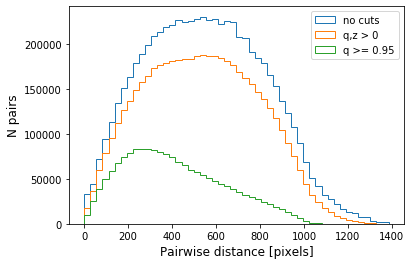

In [70]:
fig, ax = plt.subplots(1, 1)

hist_args = {'histtype':'step'}
tril_ind = np.tril_indices(dist_mat.shape[0])
hist = ax.hist(dist_mat.values[tril_ind[0], tril_ind[1]], bins=50, **hist_args, label='no cuts');

tril_ind = np.tril_indices(dist_mat.loc[cut1_df['NMAST']][cut1_df['NMAST']].shape[0])
ax.hist(dist_mat.loc[cut1_df['NMAST']][cut1_df['NMAST']].values[tril_ind[0], tril_ind[1]],
        bins=hist[1], **hist_args, label='q,z > 0');

tril_ind = np.tril_indices(dist_mat.loc[cut2_df['NMAST']][cut2_df['NMAST']].shape[0])
ax.hist(dist_mat.loc[cut1_df['NMAST']][cut2_df['NMAST']].values[tril_ind[0], tril_ind[1]],
        bins=hist[1], **hist_args, label='q >= 0.95');

ax.legend()
ax.set_xlabel("Pairwise distance [pixels]")
ax.set_ylabel("N pairs")